<h1 style="background-color:#1c6ce6;font-family:newtimeroman;color:#FFF9ED;font-size:300%;text-align:center;border-radius:10px 10px;">  😎 Summary 😎 </h1>

## Algorithms 
In this notebook we will go through a few **Clustering** types, their pros and cons as well as their implementation of key algorithms:
* **1. Centroid Clustering (KMeans, Mean Shift, Affinity Propagation):** Find globular/spherical clusters and allocate samples to each cluster, centered around a central point 
* **2. Density Clustering (DBSCAN, HDBSCAN):** Find areas of high density surrounded by areas of low density and assign these high density regions as clusters  
* **3. Hierarchical Clustering  (Agglomerative, Divisive ): ** Builds or Splits Clusters according to a distance measure. i.e. Agglomerative Clusters are formed by iterating through the samples and merging each sample into a cluster if they are close to each other compared to other samples/clusters
* **4. Distribution Clustering (Gaussian Mixture, Bayesian Gaussian Mixture**
#### Note: 
Due to memory constraints and to try not make this notebook too long we will focus on Kmeans, DBSCAN and Guassian models 

## Metrics
We will also look at a few **Metrics** which should help us understand how well the algorithms cluster the data:
* Silhouette 
* Calinski-Harabasz
* Davies Bouldin 
* Distortion (Kmeans only)
* Akaike Information Criterion (AIC) and Bayesian BIC Information Criterion (Gaussian Mixture only) 

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns 

from sklearn.cluster import AgglomerativeClustering,DBSCAN, KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, adjusted_rand_score, davies_bouldin_score
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from yellowbrick.cluster import KElbowVisualizer

sns.set_theme()
rang = range(4,15)

In [2]:
data= pd.read_csv("../input/tabular-playground-series-jul-2022/data.csv", index_col = 0  )

In [3]:
ALL_COLS = data.columns
INT_COLS = data.select_dtypes(include = "int64").columns
FLOAT_COLS = data.select_dtypes(include = "float64").columns

DATA_USED = ALL_COLS

<a id="1"></a>
<h1 style="background-color:#1c6ce6;font-family:newtimeroman;color:#FFF9ED;font-size:300%;text-align:center;border-radius:10px 10px;"> 🤖 Data Querying  🤖 </h1>

In [4]:
data

,f_00,f_01,f_02,f_03,f_04,f_05,f_06,f_07,f_08,f_09,...,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28
id,,,,,,,,,,,,,,,,,,,,,
0,-0.389420,-0.912791,0.648951,0.589045,-0.830817,0.733624,2.258560,2,13,14,...,-0.478412,-0.757002,-0.763635,-1.090369,1.142641,-0.884274,1.137896,1.309073,1.463002,0.813527
1,-0.689249,-0.453954,0.654175,0.995248,-1.653020,0.863810,-0.090651,2,3,6,...,-0.428791,-0.089908,-1.784204,-0.839474,0.459685,1.759412,-0.275422,-0.852168,0.562457,-2.680541
2,0.809079,0.324568,-1.170602,-0.624491,0.105448,0.783948,1.988301,5,11,5,...,-0.413534,-1.602377,1.190984,3.267116,-0.088322,-2.168635,-0.974989,1.335763,-1.110655,-3.630723
3,-0.500923,0.229049,0.264109,0.231520,0.415012,-1.221269,0.138850,6,2,13,...,0.619283,1.287801,0.532837,1.036631,-2.041828,1.440490,-1.900191,-0.630771,-0.050641,0.238333
4,-0.671268,-1.039533,-0.270155,-1.830264,-0.290108,-1.852809,0.781898,8,7,5,...,-1.628830,-0.434948,0.322505,0.284326,-2.438365,1.473930,-1.044684,1.602686,-0.405263,-1.987263
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97995,0.237591,1.657034,-0.689282,0.313710,-0.299039,0.329139,1.607378,5,7,8,...,-0.290116,-0.258141,-0.973640,1.369508,0.391055,2.152426,-0.208944,-1.475403,0.298448,0.445039
97996,0.322696,0.710411,0.562625,-1.321713,-0.357708,0.182024,0.178558,3,9,2,...,0.117687,1.388242,0.342400,1.680537,-0.860409,0.579165,1.162692,0.134994,0.994666,0.727642
97997,-0.249364,-0.459545,1.886122,-1.340310,0.195029,-0.559520,-0.379767,8,9,10,...,-0.850223,-1.787648,-1.268115,-1.508330,1.945622,1.503645,0.194968,2.142693,1.646042,0.641466


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 98000 entries, 0 to 97999
Data columns (total 29 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   f_00    98000 non-null  float64
 1   f_01    98000 non-null  float64
 2   f_02    98000 non-null  float64
 3   f_03    98000 non-null  float64
 4   f_04    98000 non-null  float64
 5   f_05    98000 non-null  float64
 6   f_06    98000 non-null  float64
 7   f_07    98000 non-null  int64  
 8   f_08    98000 non-null  int64  
 9   f_09    98000 non-null  int64  
 10  f_10    98000 non-null  int64  
 11  f_11    98000 non-null  int64  
 12  f_12    98000 non-null  int64  
 13  f_13    98000 non-null  int64  
 14  f_14    98000 non-null  float64
 15  f_15    98000 non-null  float64
 16  f_16    98000 non-null  float64
 17  f_17    98000 non-null  float64
 18  f_18    98000 non-null  float64
 19  f_19    98000 non-null  float64
 20  f_20    98000 non-null  float64
 21  f_21    98000 non-null  float64
 22

In [6]:
print("null values:", data.isnull().sum().sum())

null values: 0


In [7]:
data.iloc[:,:15].describe()

,f_00,f_01,f_02,f_03,f_04,f_05,f_06,f_07,f_08,f_09,f_10,f_11,f_12,f_13,f_14
count,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000
mean,0.001220,0.005580,-0.001042,-0.000700,-0.003522,-0.001612,-0.003042,5.545918,6.763061,8.193163,8.057878,8.084990,7.076388,6.286102,0.003413
std,1.002801,1.000742,1.001373,1.000422,1.003061,1.000532,0.997434,3.691840,4.152348,5.904919,4.700226,4.197106,4.433308,4.120077,0.998940
min,-4.732235,-4.202795,-4.377021,-4.010826,-4.535903,-4.300767,-4.894525,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4.377021
25%,-0.675226,-0.670985,-0.672779,-0.672540,-0.682510,-0.675066,-0.680421,3.000000,4.000000,4.000000,5.000000,5.000000,4.000000,3.000000,-0.671810
50%,0.002022,0.006650,-0.000324,-0.003185,-0.003307,0.001024,-0.002053,5.000000,6.000000,7.000000,7.000000,8.000000,6.000000,6.000000,0.003536
75%,0.677271,0.677746,0.677086,0.672097,0.677589,0.673344,0.668112,8.000000,9.000000,11.000000,11.000000,11.000000,10.000000,9.000000,0.678679
max,4.490521,4.324974,4.560247,4.399373,4.050549,4.710316,3.998595,32.000000,30.000000,44.000000,36.000000,28.000000,38.000000,30.000000,4.490521


In [8]:
data.iloc[:,15:].describe()

,f_15,f_16,f_17,f_18,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28
count,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000
mean,-0.002639,0.005404,0.001656,-0.005399,-0.004513,-0.000515,-0.001670,-0.038752,-0.220002,0.166434,-0.064309,-0.062540,0.098472,-0.230910
std,1.001096,1.003277,1.001258,0.995965,1.004372,1.002962,0.999703,1.477858,1.494836,1.543014,1.576086,1.428055,1.305407,1.528476
min,-4.535903,-4.182233,-4.468930,-4.149688,-4.894525,-4.732235,-4.438130,-6.873999,-8.234305,-7.792363,-6.593842,-7.375719,-7.335556,-6.954151
25%,-0.677757,-0.671055,-0.672635,-0.680243,-0.678773,-0.679777,-0.675147,-1.022964,-1.203204,-0.903385,-1.128966,-0.975680,-0.746489,-1.262606
50%,-0.004299,0.006535,0.001663,-0.001574,-0.000587,-0.000806,0.000819,-0.056687,-0.219046,0.167074,-0.099221,-0.070852,0.082230,-0.271319
75%,0.673859,0.680903,0.673174,0.666996,0.672149,0.675437,0.676881,0.930158,0.764690,1.217432,0.987684,0.843212,0.925306,0.770516
max,4.270708,4.157538,4.230849,4.710316,4.560247,4.399373,4.135419,6.517721,6.054831,7.527271,7.544731,7.005608,7.205971,6.977150


<a id="2"></a>
<h1 style="background-color:#1c6ce6;font-family:newtimeroman;color:#FFF9ED;font-size:300%;text-align:center;border-radius:10px 10px;"> 👽 Visualize Data  👽 </h1>

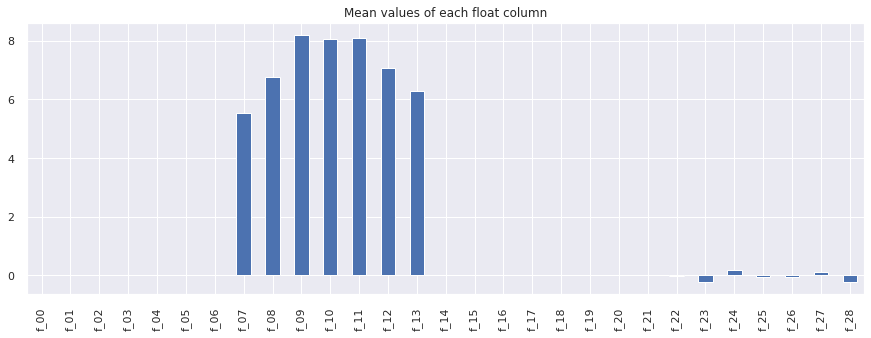

In [9]:
plt.figure(figsize= (15,5))
data.describe().loc["mean"].plot(kind="bar")
plt.title("Mean values of each float column")
plt.show()

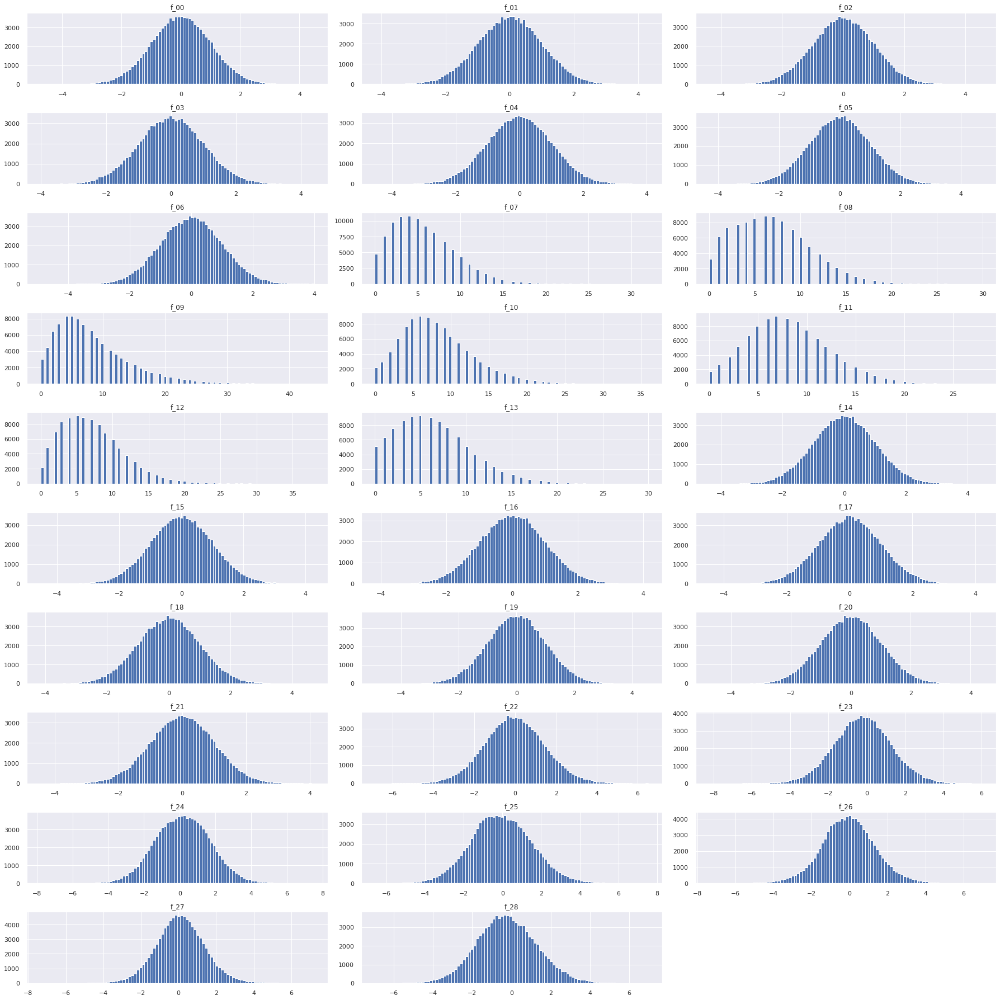

In [10]:
figure = plt.figure(figsize=(25, 25))
for i,col in enumerate(ALL_COLS):
    plt.subplot(10, 3, i+1)
    plt.hist(data[col], bins=100)
    plt.title(f'{col}')
figure.tight_layout(h_pad=1.0, w_pad=1.0)
plt.show()

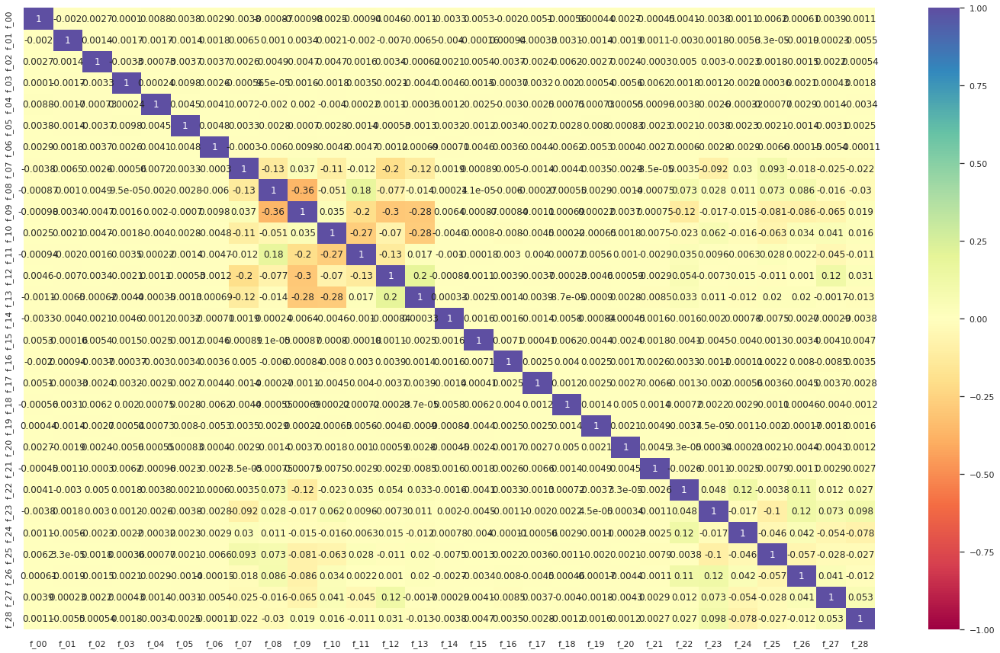

In [11]:
plt.figure(figsize = (25,15))
sns.heatmap(data.corr(), vmin= -1, vmax = 1, cmap= "Spectral", annot = True)
plt.show()

Int columns have the highest correlation between themselves however not anything significant

<a id="3"></a>
<h1 style="background-color:#1c6ce6;font-family:newtimeroman;color:#FFF9ED;font-size:300%;text-align:center;border-radius:10px 10px;"> 😯 Dimensionality Reduction with PCA 😯  </h1>

In [12]:
pca  = PCA(n_components=2) 
#all data
pca_all = pca.fit_transform(data)
pca_all = pd.DataFrame(pca_all, columns = ["pca_1","pca_2"])

#Float cols
pca_float = pca.fit_transform(data[FLOAT_COLS])
pca_float = pd.DataFrame(pca_float, columns = ["pca_1","pca_2"])

#int cols
pca_int = pca.fit_transform(data[INT_COLS])
pca_int = pd.DataFrame(pca_int, columns = ["pca_1","pca_2"])

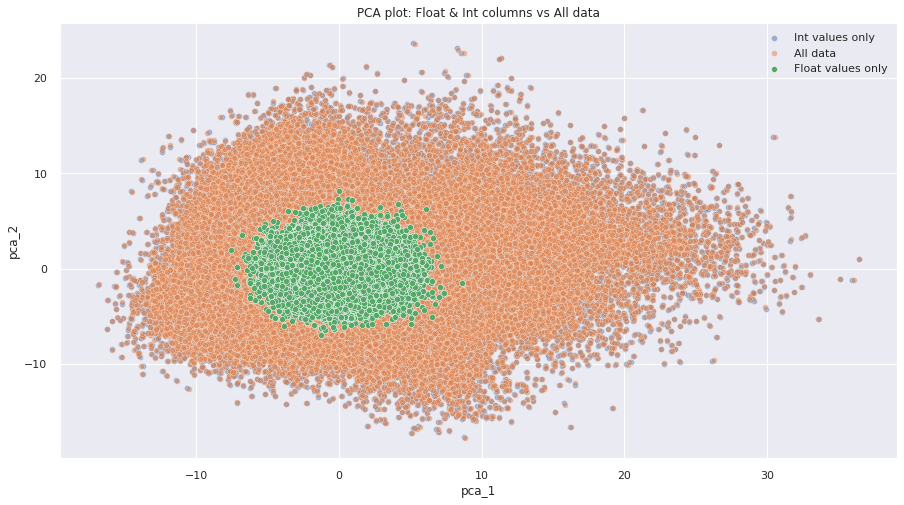

In [13]:
plt.figure(figsize = (15,8))
sns.scatterplot(data = pca_int , x = "pca_1" , y = "pca_2", label = "Int values only", alpha=  0.5)
sns.scatterplot(data = pca_all , x = "pca_1" , y = "pca_2", label = "All data", alpha=  0.5)
sns.scatterplot(data = pca_float , x = "pca_1" , y = "pca_2", label = "Float values only")
plt.title("PCA plot: Float & Int columns vs All data")
plt.show()

### Note 
We can see that our data hase no distictive shape, it is majority Convex (or spherical) however it does have irregular shapes in certain regions \
There are **no** low density regions between potential clusters  

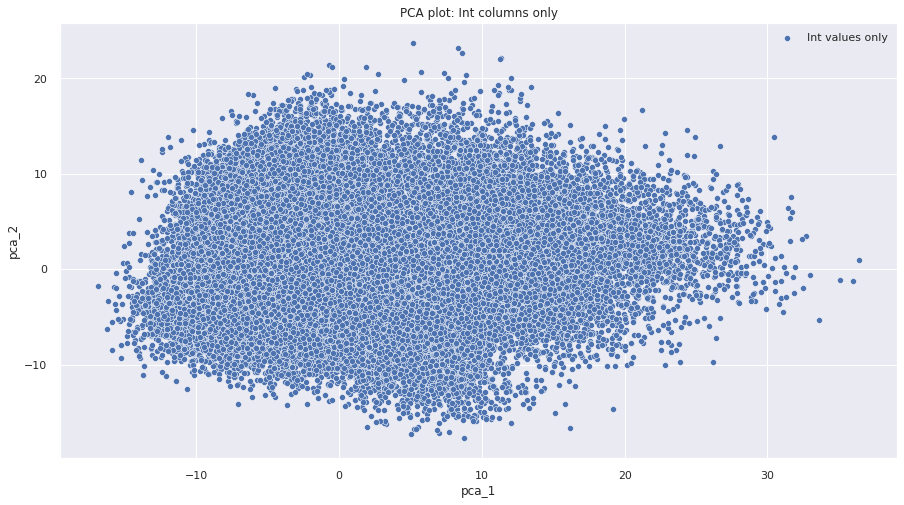

In [14]:
plt.figure(figsize = (15,8))
sns.scatterplot(data = pca_int , x = "pca_1" , y = "pca_2", label = "Int values only")
plt.title("PCA plot: Int columns only")
plt.show()

Very interesting that the data decomposes the same way for **Int** columns and **all the data**

<a id="4"></a>
<h1 style="background-color:#1c6ce6;font-family:newtimeroman;color:#FFF9ED;font-size:300%;text-align:center;border-radius:10px 10px;"> 🤓 Scaling 🤓 </h1>

* We have a number of scaling techniques, each with different pros and cons and dependent on the clustering technique
* For example k-means clustering is greatly affected by outliers as it uses euclidean distance as a measure and its process of cluster forming takes all samples into account for each cluster 
* As a result a scaling technique which isnt affected by outliers may preform better here i.e. RobustScaler 

However we will keep it simple and use StandardScaler here

In [15]:
scaler = StandardScaler()
data_s = scaler.fit_transform(data[DATA_USED])

<a id="5"></a>
<h1 style="background-color:#1c6ce6;font-family:newtimeroman;color:#FFF9ED;font-size:300%;text-align:center;border-radius:10px 10px;"> 🧐 Metrics 🧐 </h1>
The competition metric uses Adjusted Rand Index which compares the ground truth to our predictions. This is not usuable for us as we dont have the actual cluster values to compare 

#### 1. We will use 3 scoring methods
* **Silhouette** - measures the distance of each point in a cluster with each other point in the same cluster, as well as the distance of each point to points in another cluster \
Negative values show a poor clustering, with any positive number showing seperation of clusters
* **Calinski-Harabasz** (Variance Ratio Criterion) -  measures the variance of samples within the cluster vs variance with other clusters as a ratio 
A higher Calinski-Harabasz score relates to a model with better defined clusters. This is a good measure for density and will do well with distinct cluster shapes such as those used with DBSCAN
* **Davies-Bouldin** -  measures the average similarity of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances. 
Zero is the lowest possible score. Values closer to zero indicate a better partition

##### Calinski-Harabasz (higher is better) ⬆️:
* **Higher** score when clusters are **dense and well separated** 
* Higher for convex (shaped) clusters

##### Silhouette(higher is better) ⬆️:
* **Higher** score when clusters are **dense and well separated**
* Higher for **convex** (shaped) clusters

##### Davies-Bouldin (Lower is better) ⬇️:
* **Lower** score  when clusters are **dense and well separated**
* Higher for **convex** (shaped) clusters

#### 2. Using the ELBOW method for these metrics 
* We will run a number of ifferent senarios with differing cluster numbers
* We then need to find the elbow in the graphs i.e. where the values plateau

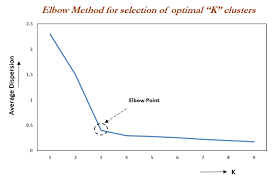

Calinski and Silhouette may produce similar ranges of values, I suspect Davies to give some decent insights as this does better for Non-Convex data \
**Note** that Calinski and Silhouette  will have an inverted elbow (Higher is better)

In [16]:
def get_scores(data_i, preds):
    sil = silhouette_score(data_i, preds,metric='euclidean')
    cal_har = calinski_harabasz_score(data_i, preds)
    dav_bou = davies_bouldin_score(data_i, preds)
    return sil, cal_har, dav_bou

In [17]:
scores_df = pd.DataFrame()
scores_df.index = rang

<a id="6"></a>
<h1 style="background-color:#1c6ce6;font-family:newtimeroman;color:#FFF9ED;font-size:300%;text-align:center;border-radius:10px 10px;">  🥶 Clustering 🥶 </h1>
The below [picture ](https://scikit-learn.org/stable/modules/clustering.html#clustering) provides a good example of how clustering algorithms work with differing data densities and shapes 

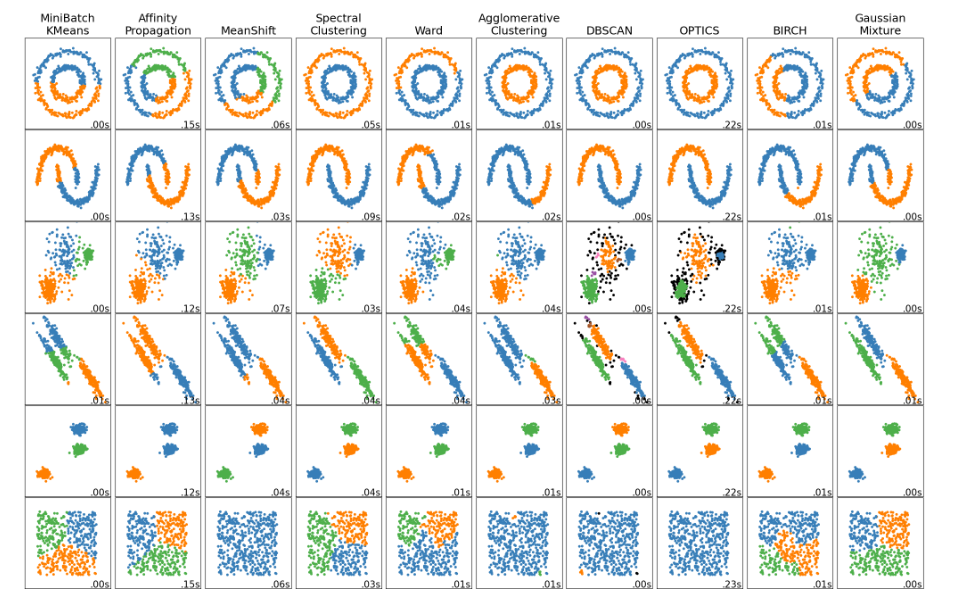

We need to pay attention to our data with respect to two area: 

### 1. Clustering Shapes 
**Convex / Spherical  vs Non-Convex Clusters:** \
Convex or Spherical Clusters are those that have distinctive 'spherical like' shapes. They are circular in nature and and dont have any irregular edges 

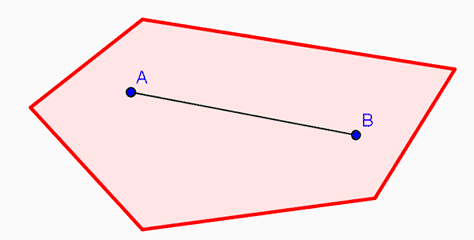

Non-Convex Clusters have irregular shapes and are generally non-spherical  

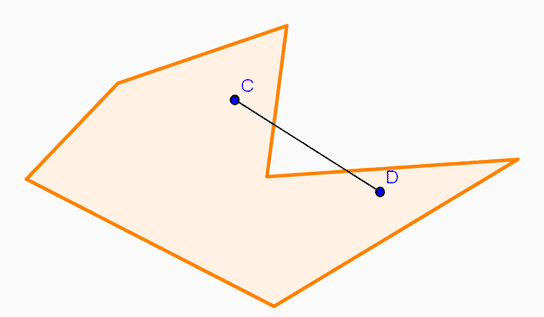

### 2. Data Density 
Certain clustering algorithms perform well where there are regions of high and low density. Specifically where low density regions surround the cluster

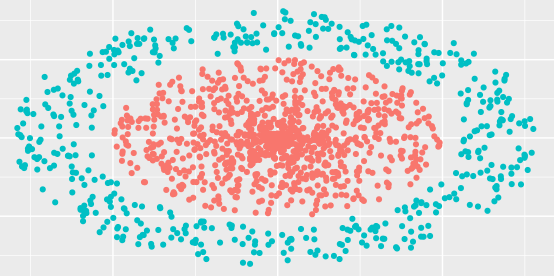

### Note
* From our PCA visuals we can see that our data wont do well with certain clustering algorithms as there is **no distictive low and high dense regions and no defined shapes**. 
* We therefore should expect algorithms that look at low and high densities to perform poorly, such as **DBSCAN** 
* **NB** our PCA plot is only looking at 2 dimensions so there could be shapes that we can only see at higher dimensions

In [18]:
pca  = PCA(n_components=2) 
#all data
pca_all = pca.fit_transform(data[DATA_USED])
pca_all = pd.DataFrame(pca_all, columns = ["pca_1","pca_2"])

<h2 style="background-color:#1c6ce6;font-family:newtimeroman;color:#FFF9ED;font-size:250%;text-align:center;border-radius:10px 10px;">  🤢 DBSCAN 🤢 </h2>
* DBSCAN performs well where the clusters are dense, separated by regions of low density 
* DBSCAN performs well with irregular shaped clusters with **sparse regions between** i.e.

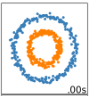

We noted in our PCA that there are no-distinctive shapes or regions of higher density, as such DBSCAN is expected to perform poorly

**DBSCAN parameters:** \
eps and min_samples are two of the most important parameters 
* eps determines the maximum distance 2 samples need to be in order to be clustered together
* min_samples are the minimum number of samples required for a cluster to be created

We will set **min_samples** to a large value as we want clusters with many samples. We will also run through different values of **eps** to check if we get different number of clusters

In [19]:
for e in [3.9, 4.1, 4.3, 5]:
    dbscan = DBSCAN(eps=e, min_samples=500, metric='euclidean',n_jobs =-1)
    preds = dbscan.fit_predict(data_s)
    vals= np.unique(preds, return_counts=True)
    print(f"\n ### eps val: {e} ###")
    print('Number of clusters:', len(vals[0]) )
    print("cluster sizes:",vals[1])


 ### eps val: 3.9 ###
Number of clusters: 1
cluster sizes: [98000]

 ### eps val: 4.1 ###
Number of clusters: 2
cluster sizes: [90785  7215]

 ### eps val: 4.3 ###
Number of clusters: 2
cluster sizes: [62873 35127]

 ### eps val: 5 ###
Number of clusters: 2
cluster sizes: [ 2561 95439]


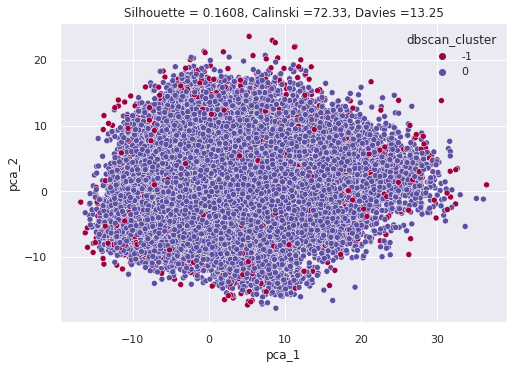

In [20]:
pca_all["dbscan_cluster"] = preds
sil, cal_har, dav_bou = get_scores (data,preds )
sns.scatterplot(data = pca_all , x = "pca_1" , y = "pca_2",hue= "dbscan_cluster", palette="Spectral")
plt.title(f"Silhouette = {sil:.4f}, Calinski ={cal_har:.2f}, Davies ={dav_bou:.2f}")
plt.show()

* We can see that there isnt much seperation of clusters 
* Confirmed that DBSCAN doesnt do well on this dataset

<h2 style="background-color:#1c6ce6;font-family:newtimeroman;color:#FFF9ED;font-size:250%;text-align:center;border-radius:10px 10px;">  🤔 KMeans 🤔 </h2>
* K-means performs well where the data is convex i.e. spherical in nature (as it identifies a centroid for each cluster)
* K-means does poorly with outliers and it sensitive to scaling

#### Note
* We can see from the PCA that our data (with the INT columns) is not perfectly spherical and therefore the clusters wont be either
* The assumption is that kmeans will do well but will not be the best algorithm for this data 

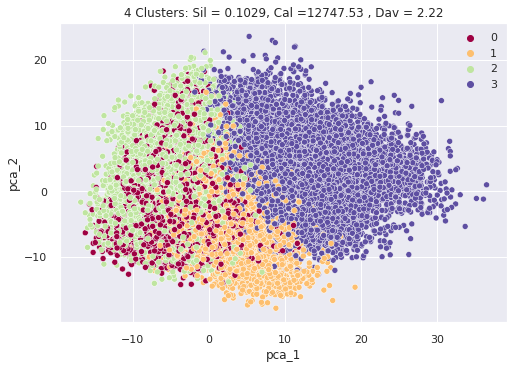

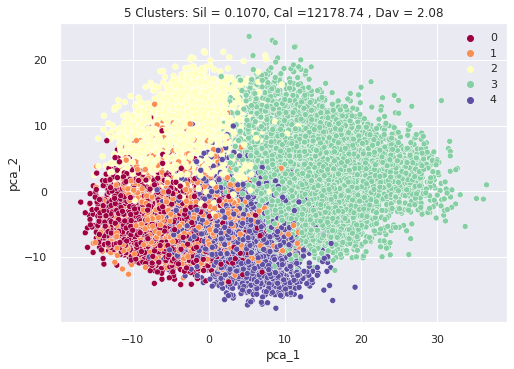

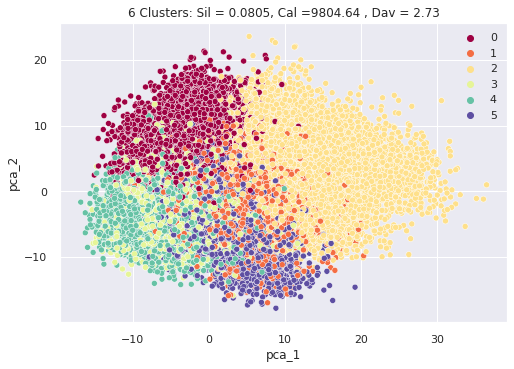

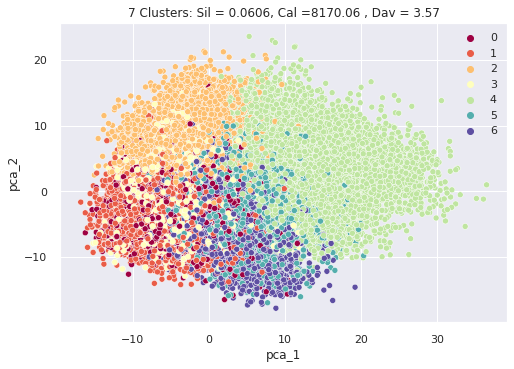

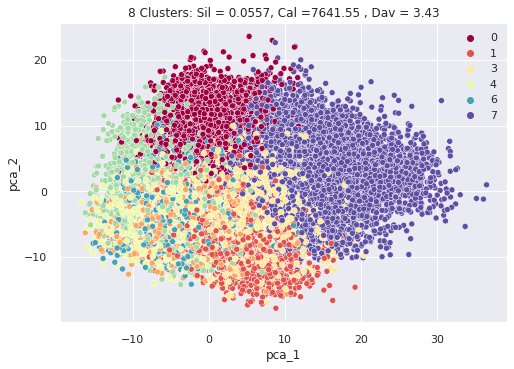

...

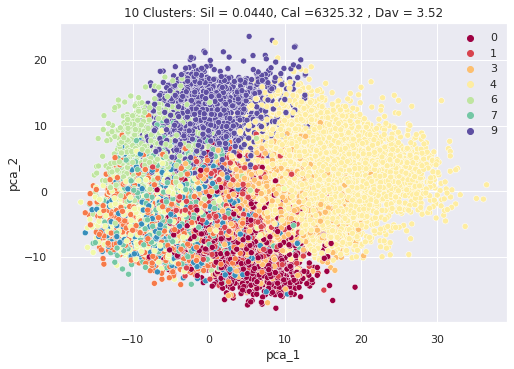

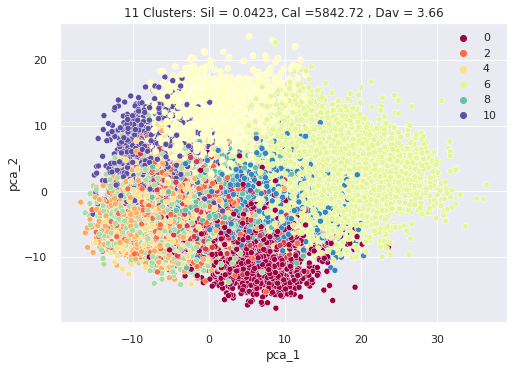

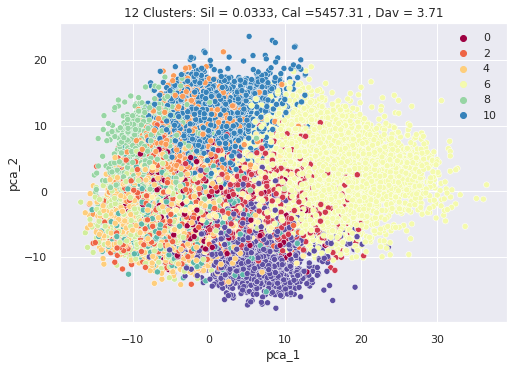

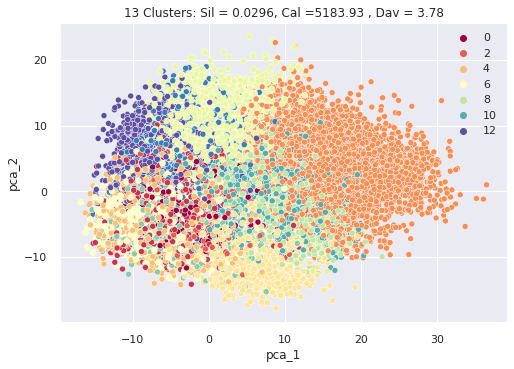

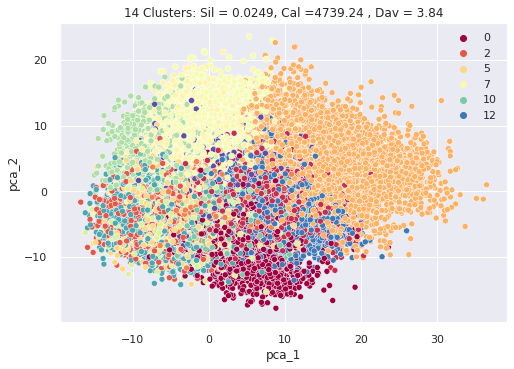

In [21]:
sil_score_kmc = []
cal_score_kmc = []
dav_score_kmc = []
distortion_kmc = []

for i in rang:
    kmc = KMeans(n_clusters = i, init='k-means++',max_iter=300)
    kmc_preds = kmc.fit_predict(data_s)
    sil, cal_har ,dav_bou = get_scores (data,kmc_preds )
    sil_score_kmc.append(sil)
    cal_score_kmc.append(cal_har)
    dav_score_kmc.append(dav_bou)
    distortion_kmc.append(kmc.inertia_)
    sns.scatterplot(data = pca_all , x = "pca_1" , y = "pca_2",hue= kmc_preds, palette="Spectral")
    plt.title(f"{i} Clusters: Sil = {sil:.4f}, Cal ={cal_har:.2f} , Dav = {dav_bou:.2f}")
    plt.show()

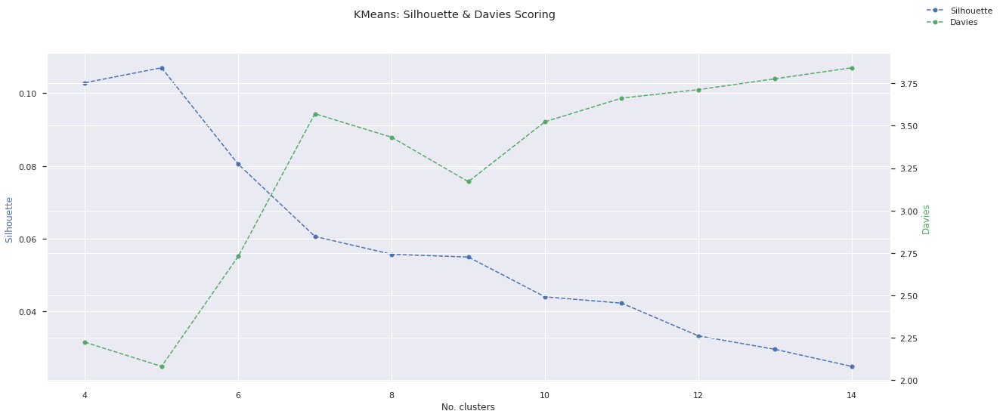

In [22]:
fig, ax1 = plt.subplots(figsize = (20,8))

ax2 = ax1.twinx()
ax1.plot(rang, sil_score_kmc, linestyle='--', marker='o', color='b', label = "Silhouette")
ax2.plot(rang, dav_score_kmc, linestyle='--', marker='o', color='g', label = "Davies")
ax1.set_xlabel('No. clusters')
ax1.set_ylabel('Silhouette ',color='b')
ax2.set_ylabel('Davies', color='g')
fig.legend()
fig.suptitle("KMeans: Silhouette & Davies Scoring")
plt.show()

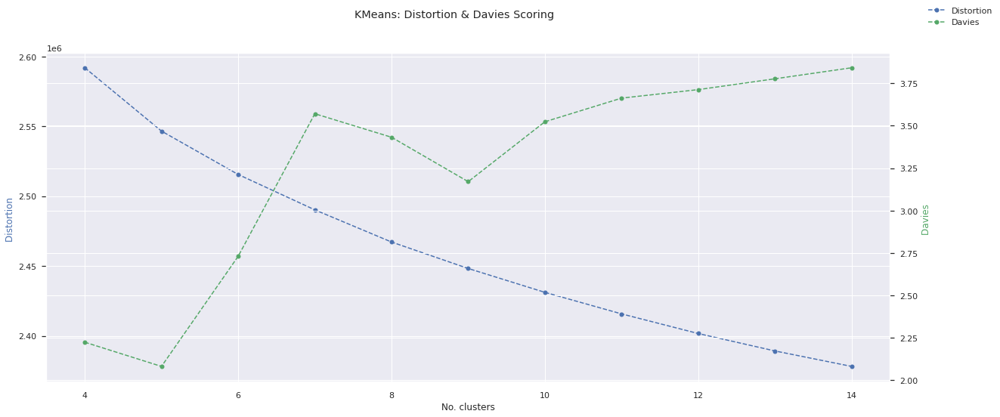

In [23]:
fig, ax1 = plt.subplots(figsize = (20,8))

ax2 = ax1.twinx()
ax1.plot(rang, distortion_kmc, linestyle='--', marker='o', color='b', label = "Distortion")
ax2.plot(rang, dav_score_kmc, linestyle='--', marker='o', color='g', label = "Davies")
ax1.set_xlabel('No. clusters')
ax1.set_ylabel('Distortion ',color='b')
ax2.set_ylabel('Davies ', color='g')
fig.legend()
fig.suptitle("KMeans: Distortion & Davies Scoring")
plt.show()

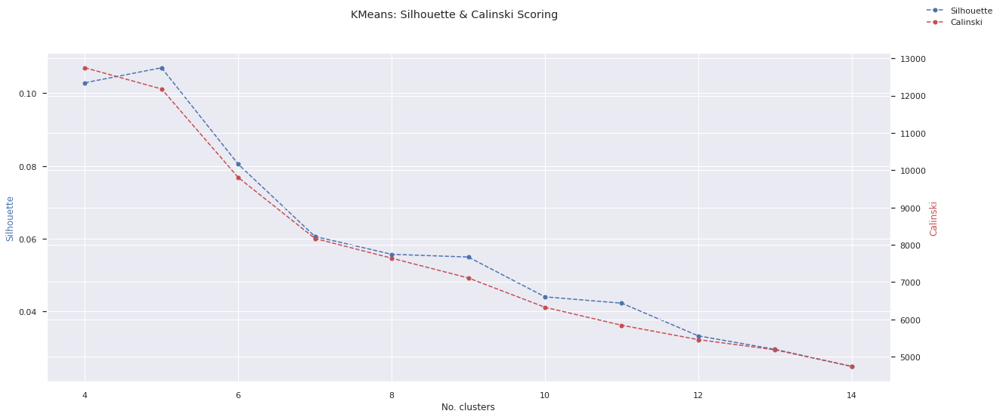

In [24]:
fig, ax1 = plt.subplots(figsize = (20,8))

ax2 = ax1.twinx()
ax1.plot(rang, sil_score_kmc, linestyle='--', marker='o', color='b', label = "Silhouette")
ax2.plot(rang, cal_score_kmc, linestyle='--', marker='o', color='r', label = "Calinski")
ax1.set_xlabel('No. clusters')
ax1.set_ylabel('Silhouette',color='b')
ax2.set_ylabel('Calinski', color='r')
fig.legend()
fig.suptitle("KMeans: Silhouette & Calinski Scoring")
plt.show()

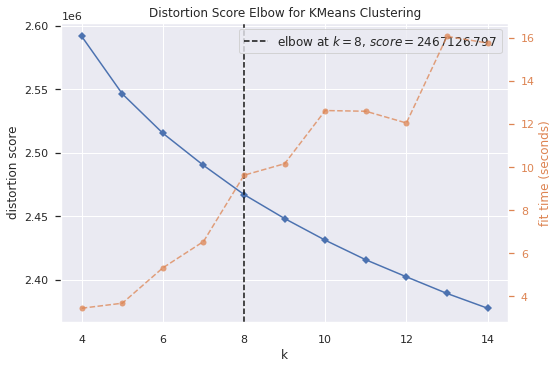

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [25]:
visualizer = KElbowVisualizer(kmc, k=rang)
visualizer.fit(data_s)    
visualizer.poof()

In [26]:
#save scores 
scores_df["sil_kmc"]= sil_score_kmc
scores_df["cal_kmc"]= cal_score_kmc
scores_df["dav_kmc"]= dav_score_kmc
scores_df["dist_kmc"]= distortion_kmc

<h2 style="background-color:#1c6ce6;font-family:newtimeroman;color:#FFF9ED;font-size:250%;text-align:center;border-radius:10px 10px;">  🤩 Guassian Mixture 🤩 </h2>
Guassian Mixture creates K number of guassian distributions, where the width of each guassion relates to the covariance of the data (spherical, diagonal, tied or full covariance)

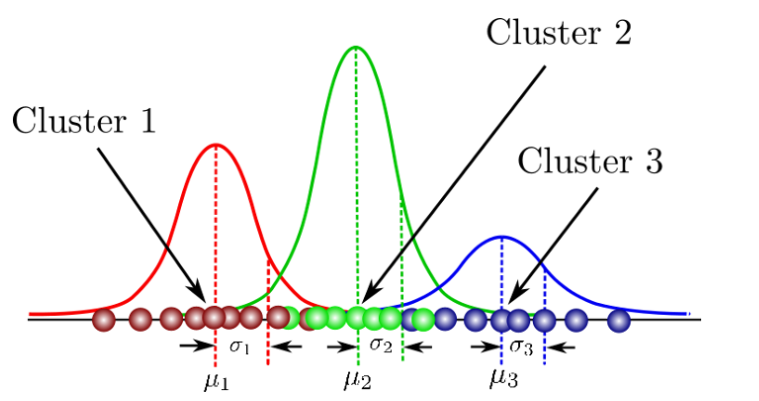

* Guassian Mixture is similar to kmeans where it initialises the centroid (therefore multiple random initializations are required to find the global optimum) 
* Guassian Mixture K-means performs well where the data is convex i.e. spherical in nature (as it identifies a centroid for each cluster)
* Each cluster can have different shapes due to how the guassian distributions are found and with different covariance parameters

#### Note
* From our PCA plot the data is semi-convex in nature and doesnt have any sparse regions between clusters
* Clusters could also be different sizes 
* I suspect Guassian Mixture to do well

With Guassian Mixture we have 2 internal metrics provided by the sklearn algorithm BIC and AIC where a **lower value **shows a better clustering

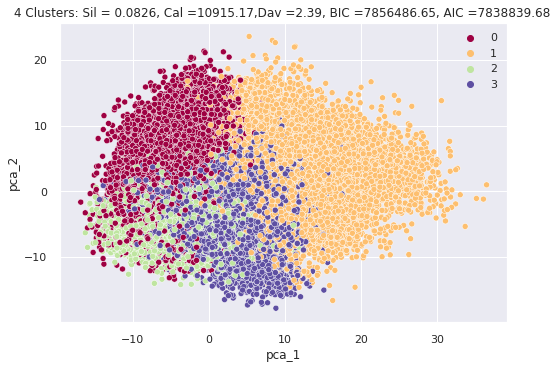

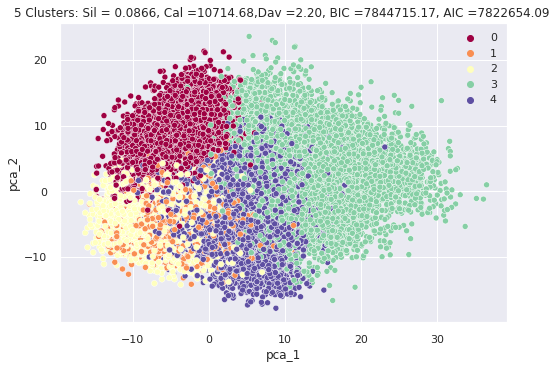

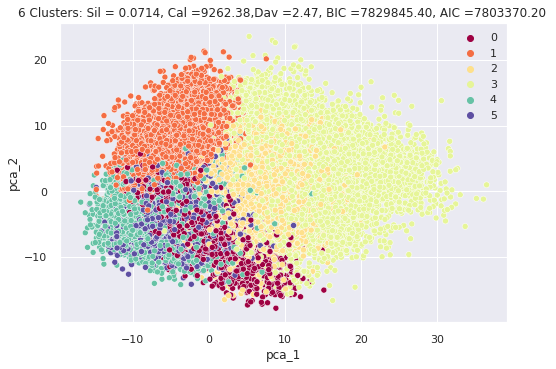

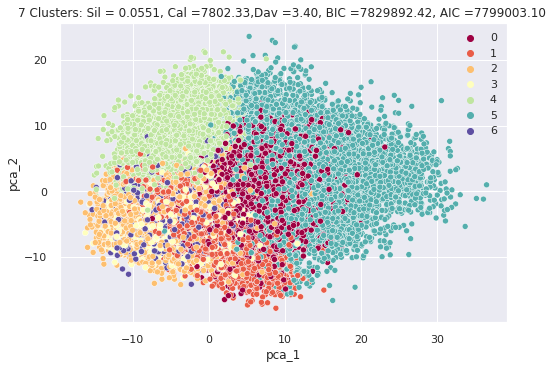

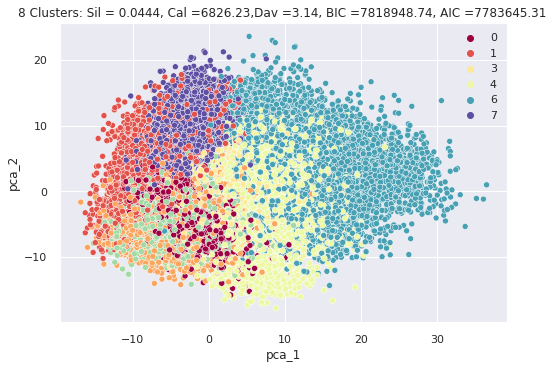

...

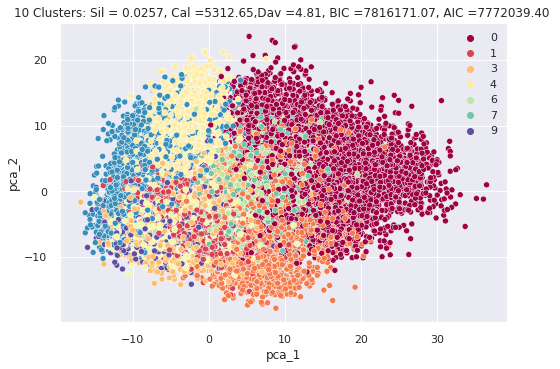

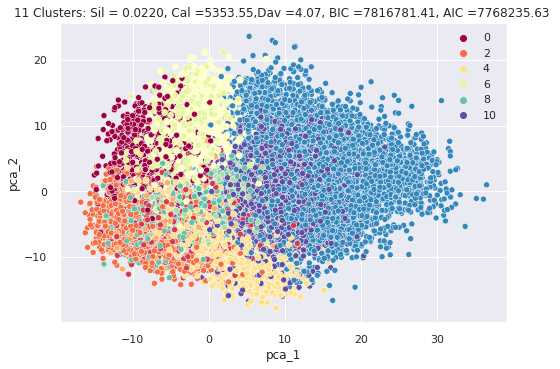

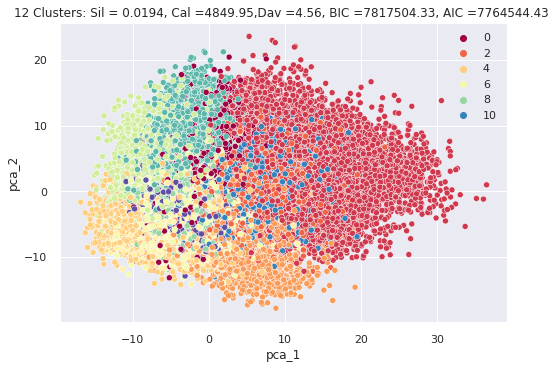

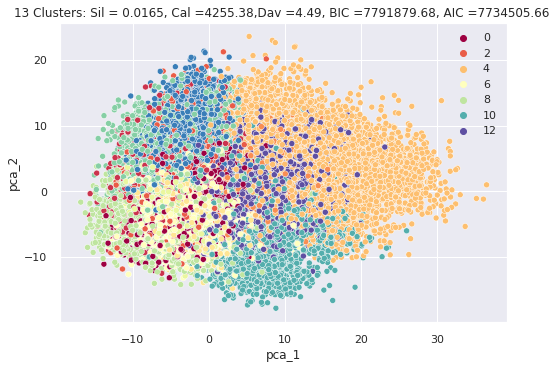

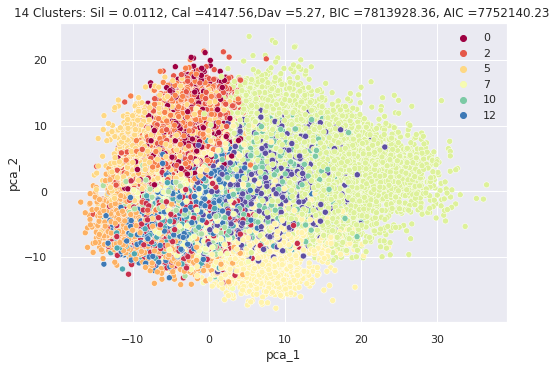

In [27]:
sil_score = []
cal_score = []
dav_score = []
bic_score = []
aic_score = []

for i in rang:
    gm = GaussianMixture(n_components=i)
    gm_preds = gm.fit_predict(data_s)
    sil, cal_har,dav_bou = get_scores (data,gm_preds )
    bic = gm.bic(data_s)
    aic = gm.aic(data_s)
    bic_score.append(bic)
    aic_score.append(aic)
    sil_score.append(sil)
    dav_score.append(dav_bou)
    cal_score.append(cal_har)
    sns.scatterplot(data = pca_all , x = "pca_1" , y = "pca_2",hue= gm_preds, palette="Spectral")
    plt.title(f"{i} Clusters: Sil = {sil:.4f}, Cal ={cal_har:.2f},Dav ={dav_bou:.2f}, BIC ={bic:.2f}, AIC ={aic:.2f} ")
    plt.show()

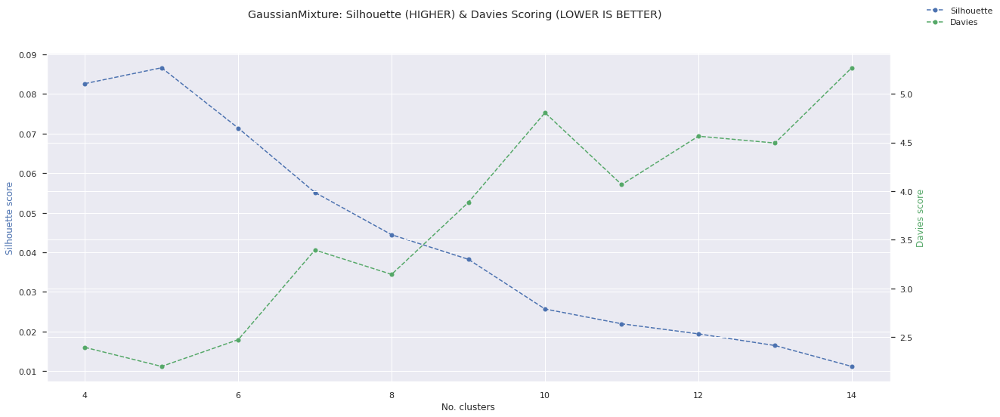

In [28]:
fig, ax1 = plt.subplots(figsize = (20,8))

ax2 = ax1.twinx()

ax1.plot(rang, sil_score, linestyle='--', marker='o', color='b',label = "Silhouette")
ax2.plot(rang, dav_score, linestyle='--', marker='o', color='g', label = "Davies")
ax1.set_xlabel('No. clusters')
ax1.set_ylabel('Silhouette score',color='b')
ax2.set_ylabel('Davies score', color='g')
fig.legend()
fig.suptitle("GaussianMixture: Silhouette (HIGHER) & Davies Scoring (LOWER IS BETTER)")
plt.show()

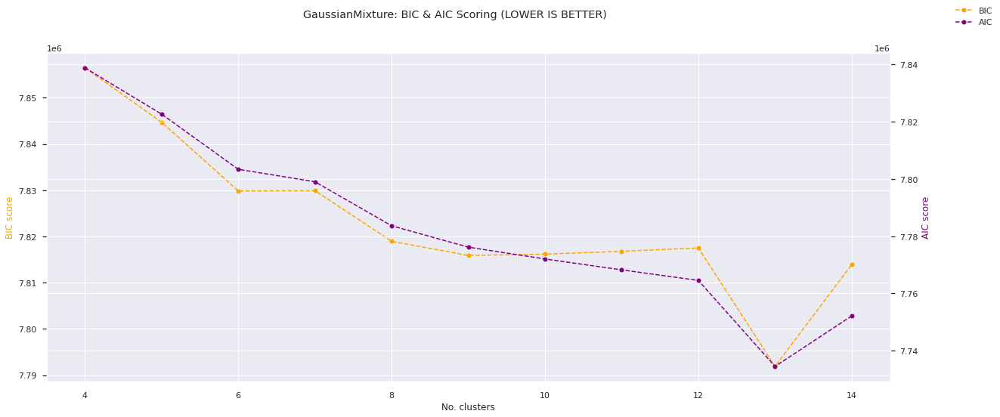

In [29]:
fig, ax1 = plt.subplots(figsize = (20,8))

ax2 = ax1.twinx()
ax1.plot(rang, bic_score, linestyle='--', marker='o', color='orange',label = "BIC")
ax2.plot(rang, aic_score, linestyle='--', marker='o', color='purple',label = "AIC")
ax1.set_xlabel('No. clusters')
ax1.set_ylabel('BIC score',color='orange')
ax2.set_ylabel('AIC score', color='purple')
fig.legend()
fig.suptitle("GaussianMixture: BIC & AIC Scoring (LOWER IS BETTER)")
plt.show()

Note that with BIC and AIC we are looking for the ELBOW (i.e where there is a plateau) 
* with the above graph cluster = 7 looks to be a good point to start

In [30]:
#save scores 
scores_df["sil_gm"]= sil_score
scores_df["cal_gm"]= cal_score
scores_df["dav_gm"]= dav_score
scores_df["bic_gm"]= bic_score
scores_df["aic_gm"]= aic_score

<h2 style="background-color:#1c6ce6;font-family:newtimeroman;color:#FFF9ED;font-size:250%;text-align:center;border-radius:10px 10px;">  🤭 Bayesian Gaussian Mixture 🤭 </h2>

/opt/conda/lib/python3.7/site-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


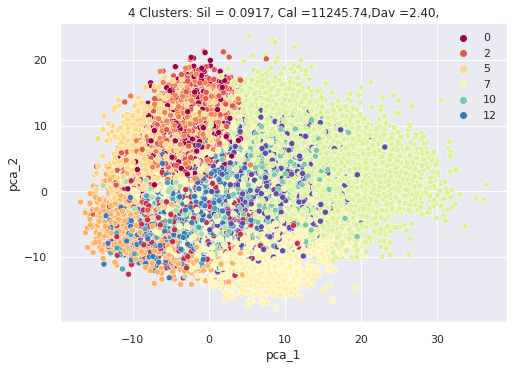

/opt/conda/lib/python3.7/site-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


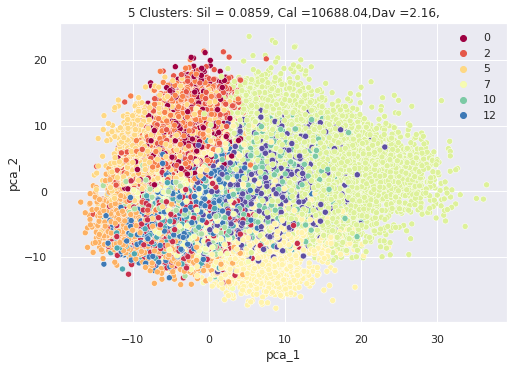

/opt/conda/lib/python3.7/site-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


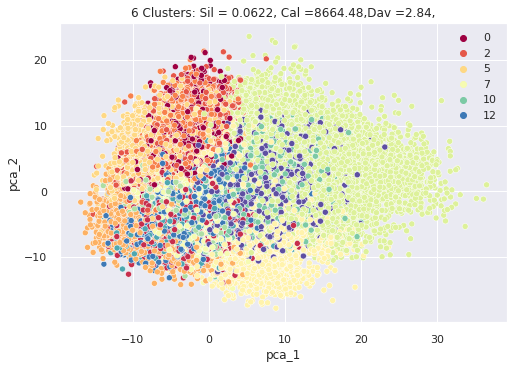

/opt/conda/lib/python3.7/site-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


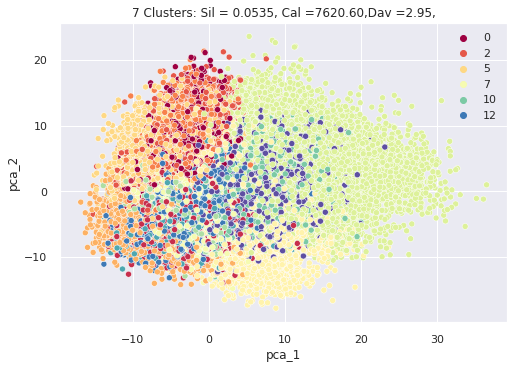

/opt/conda/lib/python3.7/site-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


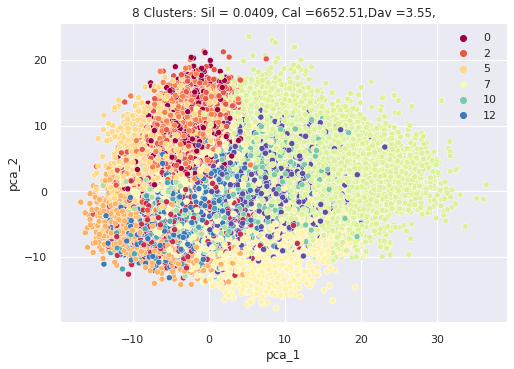

/opt/conda/lib/python3.7/site-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


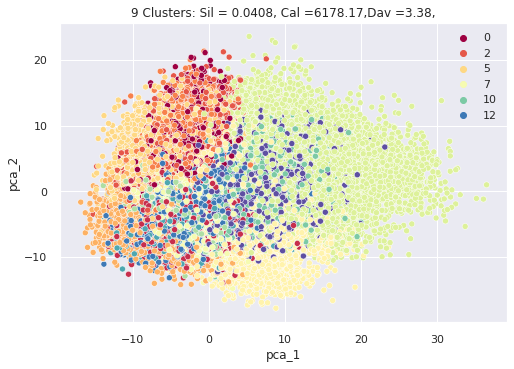

/opt/conda/lib/python3.7/site-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


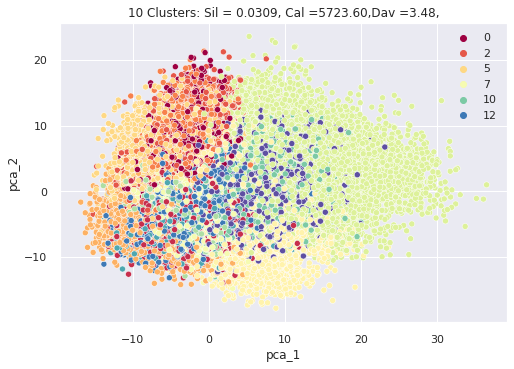

/opt/conda/lib/python3.7/site-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


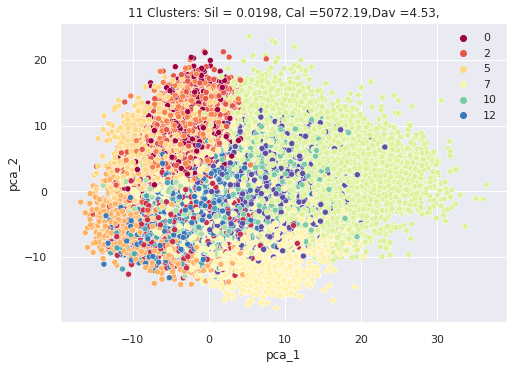

/opt/conda/lib/python3.7/site-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


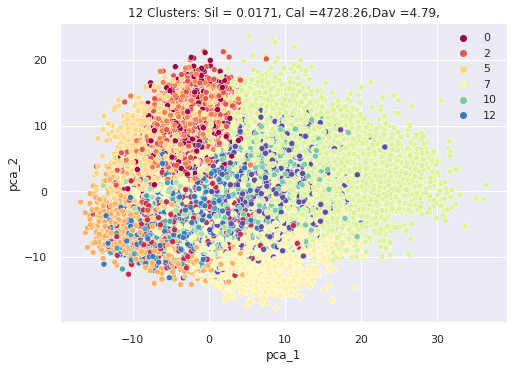

/opt/conda/lib/python3.7/site-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


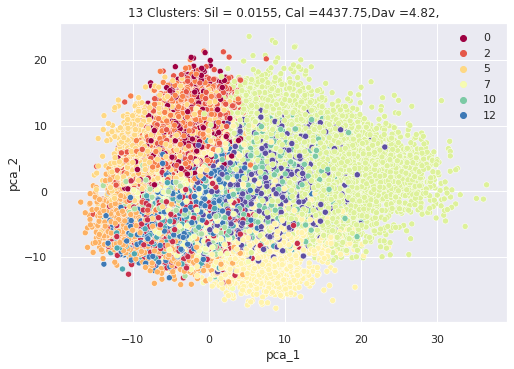

/opt/conda/lib/python3.7/site-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


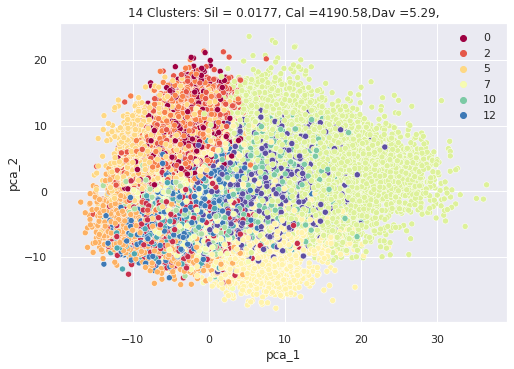

In [31]:
sil_score_bgm = []
cal_score_bgm = []
dav_score_bgm = []

for i in rang:
    bgm = BayesianGaussianMixture(n_components=i)
    bgm_preds = bgm.fit_predict(data_s)
    sil, cal_har,dav_bou = get_scores (data,bgm_preds )
    sil_score_bgm.append(sil)
    dav_score_bgm.append(dav_bou)
    cal_score_bgm.append(cal_har)
    sns.scatterplot(data = pca_all , x = "pca_1" , y = "pca_2",hue= gm_preds, palette="Spectral")
    plt.title(f"{i} Clusters: Sil = {sil:.4f}, Cal ={cal_har:.2f},Dav ={dav_bou:.2f},")
    plt.show()

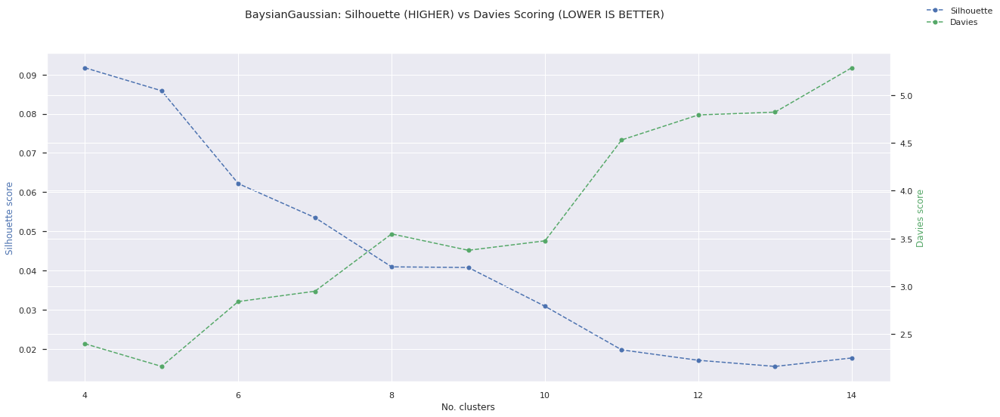

In [32]:
fig, ax1 = plt.subplots(figsize = (20,8))

ax2 = ax1.twinx()

ax1.plot(rang, sil_score_bgm, linestyle='--', marker='o', color='b',label = "Silhouette")
ax2.plot(rang, dav_score_bgm, linestyle='--', marker='o', color='g', label = "Davies")
ax1.set_xlabel('No. clusters')
ax1.set_ylabel('Silhouette score',color='b')
ax2.set_ylabel('Davies score', color='g')
fig.legend()
fig.suptitle("BaysianGaussian: Silhouette (HIGHER) vs Davies Scoring (LOWER IS BETTER)")
plt.show()

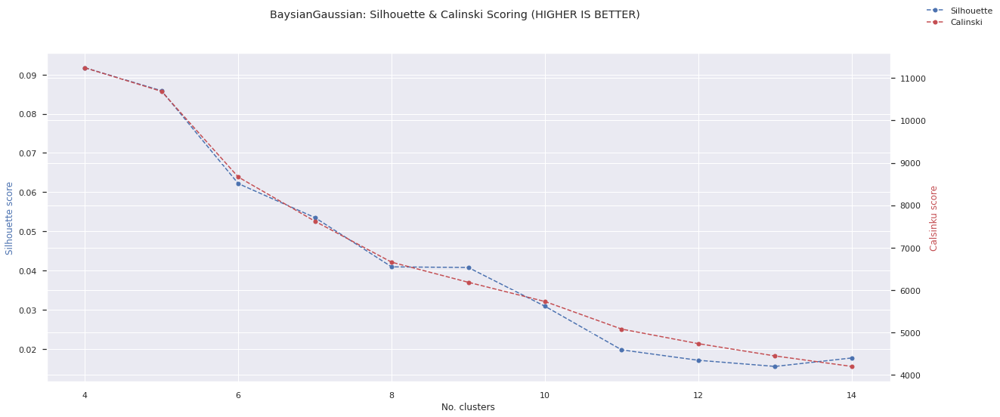

In [33]:
fig, ax1 = plt.subplots(figsize = (20,8))

ax2 = ax1.twinx()

ax1.plot(rang, sil_score_bgm, linestyle='--', marker='o', color='b',label = "Silhouette")
ax2.plot(rang, cal_score_bgm, linestyle='--', marker='o', color='r', label = "Calinski")
ax1.set_xlabel('No. clusters')
ax1.set_ylabel('Silhouette score',color='b')
ax2.set_ylabel('Calsinku score', color='r')
fig.legend()
fig.suptitle("BaysianGaussian: Silhouette & Calinski Scoring (HIGHER IS BETTER)")
plt.show()

In [34]:
#save scores 
scores_df["sil_bgm"]= sil_score_bgm
scores_df["cal_bgm"]= cal_score_bgm
scores_df["dav_bgm"]= dav_score_bgm

<a id="7"></a>
<h1 style="background-color:#1c6ce6;font-family:newtimeroman;color:#FFF9ED;font-size:300%;text-align:center;border-radius:10px 10px;"> 👻 Submission  👻 </h1>

In [35]:
(scores_df.style.highlight_max(axis=0, props='background-color:lightgreen;', subset=['sil_kmc', 'cal_kmc', 'dist_kmc', 'sil_gm', 'cal_gm',  'sil_bgm', 'cal_bgm'
                                                                                    ])
         .highlight_min(axis=0, props='background-color:lightgreen;', subset=['bic_gm', 'aic_gm','dav_kmc','dav_gm','dav_bgm'])
         )

,sil_kmc,cal_kmc,dav_kmc,dist_kmc,sil_gm,cal_gm,dav_gm,bic_gm,aic_gm,sil_bgm,cal_bgm,dav_bgm
4,0.102875,12747.530273,2.222359,2591865.826457,0.082615,10915.174113,2.394800,7856486.653342,7838839.681735,0.091723,11245.744369,2.397004
5,0.106997,12178.742013,2.079574,2546538.078573,0.086624,10714.675516,2.199149,7844715.174415,7822654.086726,0.085856,10688.042000,2.159238
6,0.080466,9804.640119,2.729384,2515475.920740,0.071383,9262.378880,2.473997,7829845.399662,7803370.195891,0.062180,8664.480838,2.839021
7,0.060611,8170.064961,3.570991,2490152.432985,0.055123,7802.330346,3.395322,7829892.417200,7799003.097346,0.053508,7620.596829,2.946980
8,0.055708,7641.546327,3.432169,2467127.290324,0.044443,6826.232543,3.144727,7818948.743361,7783645.307425,0.040938,6652.512263,3.547715
9,0.054953,7111.535525,3.170007,2448184.890555,0.038243,6158.462196,3.883740,7815884.826436,7776167.274418,0.040775,6178.167515,3.375948
10,0.044008,6325.321334,3.523642,2431107.781226,0.025686,5312.652973,4.805567,7816171.068702,7772039.400602,0.030885,5723.601342,3.475093
11,0.042271,5842.717405,3.663144,2415682.124807,0.021951,5353.546868,4.066769,7816781.414548,7768235.630366,0.019764,5072.188048,4.532536
12,0.033271,5457.306487,3.713267,2401628.902290,0.019409,4849.950557,4.564314,7817504.332379,7764544.432114,0.017106,4728.260286,4.794453
13,0.029578,5183.931858,3.777260,2389156.626063,0.016458,4255.376298,4.494198,7791879.680001,7734505.663654,0.015544,4437.749680,4.823861


### Kmeans
The elbow method shows a few areas of interest at clusters 11,12 ,14

In [36]:
sub = pd.read_csv('../input/tabular-playground-series-jul-2022/sample_submission.csv',index_col = 0)

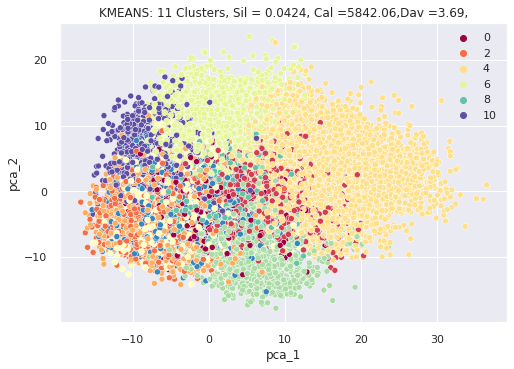

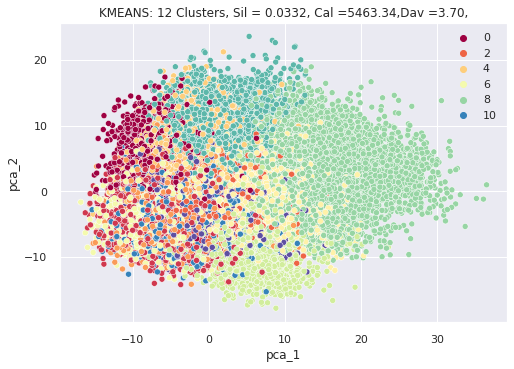

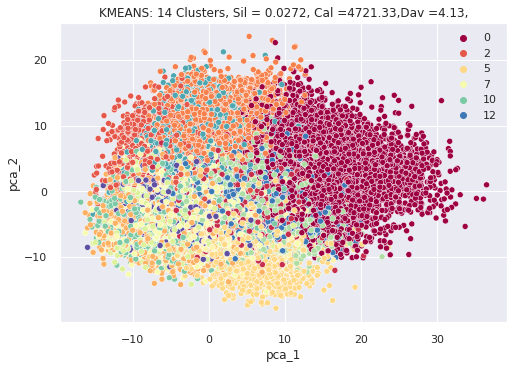

In [37]:
for i in [11,12,14]:
    kmc = KMeans(n_clusters = i, init='k-means++',max_iter=300)
    pred_kmc = kmc.fit_predict(data_s)
    sil, cal_har,dav_bou = get_scores (data,pred_kmc )
    
    sub["Predicted"] = pred_kmc
    sub.to_csv(f"submission_kmc{i}.csv")
    sns.scatterplot(data = pca_all , x = "pca_1" , y = "pca_2",hue= pred_kmc, palette="Spectral")
    plt.title(f"KMEANS: {i} Clusters, Sil = {sil:.4f}, Cal ={cal_har:.2f},Dav ={dav_bou:.2f},")
    plt.show()

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:ylabel='count'>

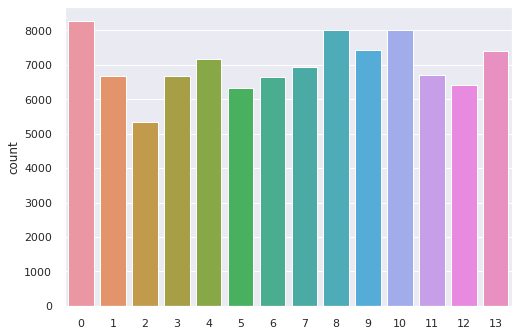

In [38]:
sns.countplot(pred_kmc)

### GaussianMixture
The elbow method shows a few areas of interest at clusters 7,8,9,10

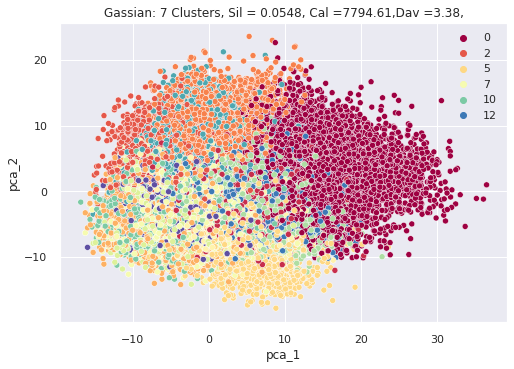

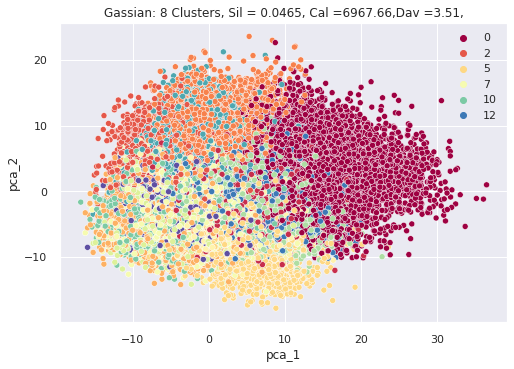

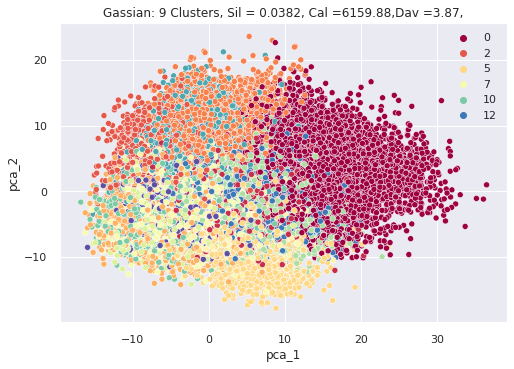

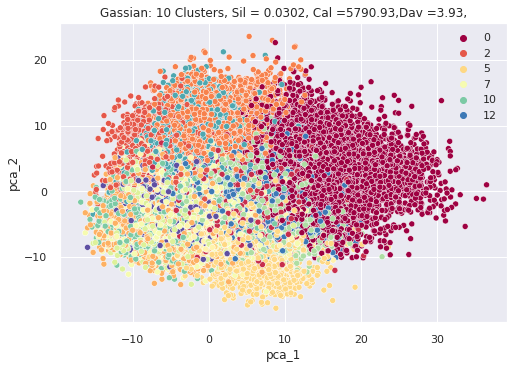

In [39]:
for i in [7,8,9,10]:
    gm = GaussianMixture(n_components=i)
    pred_gm = gm.fit_predict(data_s)
    sil, cal_har,dav_bou = get_scores (data,pred_gm )

    sub["Predicted"] = pred_gm
    sub.to_csv(f"submission_gm{i}.csv")
    sns.scatterplot(data = pca_all , x = "pca_1" , y = "pca_2",hue= pred_kmc, palette="Spectral")
    plt.title(f"Gassian: {i} Clusters, Sil = {sil:.4f}, Cal ={cal_har:.2f},Dav ={dav_bou:.2f},")
    plt.show()

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:ylabel='count'>

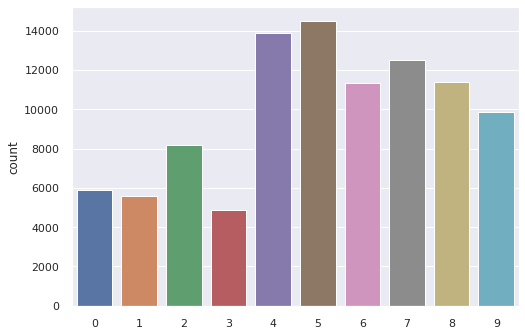

In [40]:
sns.countplot(pred_gm)

### BayesianGaussianMixture
The elbow method shows a few areas of interest at clusters 6 (we will include 7 as well)

/opt/conda/lib/python3.7/site-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


    Predicted
Id           
0           1
1           4
2           1
3           2
4           5


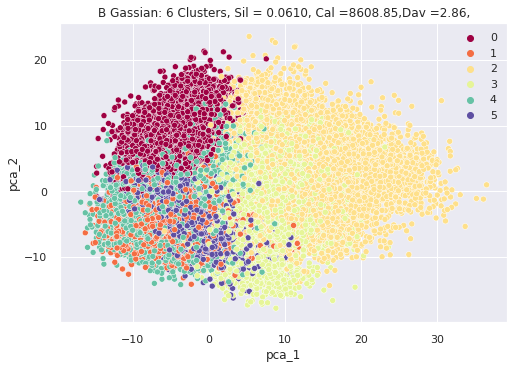

/opt/conda/lib/python3.7/site-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


    Predicted
Id           
0           0
1           4
2           0
3           5
4           3


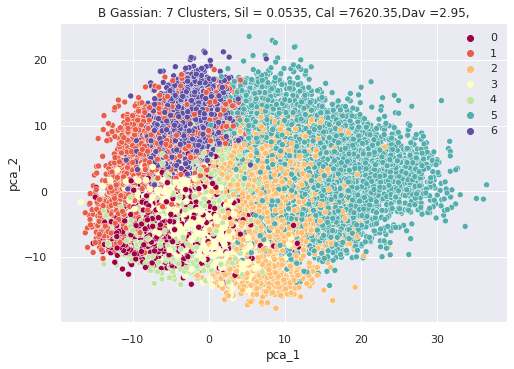

In [41]:
for i in [6,7]:
    bgm = BayesianGaussianMixture(n_components=i)
    pred_bgm = bgm.fit_predict(data_s)
    sil, cal_har,dav_bou = get_scores (data,pred_bgm )

    sub["Predicted"] = pred_bgm
    sub.to_csv(f"submission_bgm{i}.csv")
    print(sub.head())
    sns.scatterplot(data = pca_all , x = "pca_1" , y = "pca_2",hue= pred_bgm, palette="Spectral")
    plt.title(f"B Gassian: {i} Clusters, Sil = {sil:.4f}, Cal ={cal_har:.2f},Dav ={dav_bou:.2f},")
    plt.show()

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:ylabel='count'>

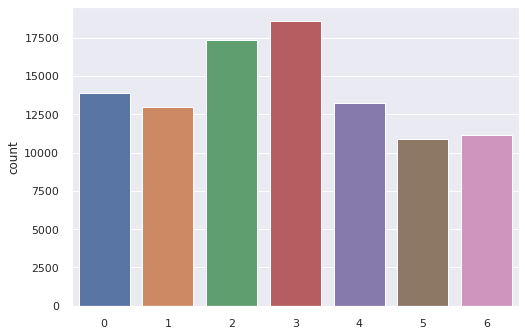

In [42]:
sns.countplot(pred_bgm)